Compiled by [Zhisong He](https://zhisonghe.wixsite.com/home/)\
Updated on 2025-03-05

# Table of Contents

* [Introduction](#Introduction)
* [Preparation](#Preparation)
* [Part-1: Analyzing a mono-batch-scRNA-seq data set](#Part-1:-Analyzing-a-mono-batch-scRNA-seq-data-set)
  * [Import packages](#Import-important-Python-packages)
  * [Create anndata object](#Create-the-anndata-object-for-the-scRNA-seq-data-set)
  * [From raw counts to UMAP](#From-the-raw-counts-to-a-UMAP)
  * [Clustering and cell type annotation](#From-the-raw-counts-to-a-UMAP)
  * [Pseudotime analysis](#Pseudotime-analysis)
  * [Trajectory and fate probability analysis](#Trajectory-and-fate-probability-analysis)
* [Part-2: Analyzing a multi-batch scRNA-seq data set](#Part-2:-Analyzing-a-multi-batch-scRNA-seq-data-set)
  * [Load and merge different batches into a joint anndata](#Load-and-merge-different-batches-into-a-joint-data-set)
  * [From the raw counts to UMAP](#From-the-raw-counts-to-UMAP)
  * [Data integration or batch effect correction](#Data-integration-or-batch-effect-correction)
  * [Clustering and pseudotime analysis based on the integrated data](#Clustering-and-pseudotime-analysis-based-on-the-integrated-data)
* [Part-3: Advanced scRNA-seq analysis with Python](#Part-3:-Advanced-scRNA-seq-analysis-with-Python)

# Introduction

Nowsdays, the `Seurat` package in R, together with the gigantic ecosystem built around the Seurat object data structure it defines, is probably still the most commonly used framework to analyze data of scRNA-seq experiments. This great system, however, suffers several limitations, due to some fundamental drawback of R, the programming language and system it relies on.

Firstly, in a scRNA-seq data set, the number of detected genes per cell is limited. Therefore, the sparseness of the scRNA-seq expression matrix is usually very high, *i.e.* the expression matrix includes huge amount (way more than 50%) of zeros. To efficiently store a sparse matrix like that, a `SparseMatrix` object is used in `Seurat`, in which only the non-zero items and their coordinates in the matrix are stored, which makes it memory-efficient if a matrix includes >67% zeros. All look great so far. However, the `SparseMatrix` object defined in R has a limitation. It has a validation procedure, one of which is to check whether the number of non-zero items is a non-negative integer. This looks making fully sense, but since R represents an integer by 32 bits, the largest integer it can represent is 4294967296. This looks huge, but if we assume the average number of detected gene per cell in a data set is 4000, this number of non-zero items supports no more than 1073742 cells. This is big enough if you only need to analyze one or several 10x Genomics scRNA-seq data together. However, many atlas-level scRNA-seq data set nowadays have already the throughput beyond this level. For example, the first-trimester human brain atlas by the Linnarsson lab in Karolinska Institutet, which was [published in 2023 in Science](https://www.science.org/doi/10.1126/science.adf1226) but [preprinted a year before](https://www.biorxiv.org/content/10.1101/2022.10.24.513487v1) includes 1.6 million cells; the [adult human brain atlas](https://www.science.org/doi/10.1126/science.add7046), also by the Linnarsson lab, includes >3.3 million cells; the [integrated transcriptomic atlas of brain organoids](https://www.nature.com/articles/s41586-024-08172-8) by our lab includes 1.7 million cells. As the development of scRNA-seq platforms based on the split-pool combinatorial barcoding strategy, such as [Evercode WT](https://www.parsebiosciences.com/products/evercode-wt-penta/) by Parse Bioscience and [QuantumScale](https://scale.bio/single-cell-rna-sequencing-kit/) by Scale Bioscience, is making it possible to generate scRNA-seq data of several million cells in one single experiment. That means, there will be just more and more million-cell-level scRNA-seq data set being generated and need to be analyzed.

Secondly, as more and more, larger and larger scRNA-seq data being generated, many deep-learning-based tools have been developed for the analysis. Many of them have shown their privilege to the more classical approaches in different applications such as data integration (e.g. [scVI](https://www.nature.com/articles/s41592-018-0229-2), [scANVI](https://www.embopress.org/doi/full/10.15252/msb.20209620), [scPoli](https://www.nature.com/articles/s41592-023-02035-2)), perturbation prediction (e.g. [scGen](https://www.nature.com/articles/s41592-019-0494-8), [CPA](https://www.embopress.org/doi/full/10.15252/msb.202211517)), data projection with transfer learning (e.g. [scArches](https://www.nature.com/articles/s41587-021-01001-7)) and so on. This is particularly true for huge data set, but some of those applications (such as data projection) can also benefit the analysis of smaller scRNA-seq data. Obviously, it is Python, not R, that is the common programming language in the current era of deep learning. In fact, all the mentioned methods are implemented in Python.

Thirdly, R is also known to be slow. It has great optimization on certain operations (such as matrix operations), but overall it is one of the slowest programming language. In fact, according to the [Recursive Fibonacci Benchmark](https://github.com/drujensen/fib), it is the slowest one among the popular programming language. This is not necessarily a big issue when running time is not the most crucial issue, as there are also advantages of R on statistical analysis and visualization compared to other languages. However, when the data size increases, or computation-intensive analysis is needed, this becomes a critical drawback to use R. This is also the motivation of many tool developers, including those who developed the original tools in R, to make the Python implementations (e.g. [SCENIC](https://www.nature.com/articles/nmeth.4463) and [pySCENIC](https://pyscenic.readthedocs.io/en/latest/), [velocyto](https://www.nature.com/articles/s41586-018-0414-6) and [velocyto.py](https://velocyto.org/velocyto.py/)).

Due to these limitations, more and more people on single-cell genomics are switching from R to Python. This is also the motivation of this tutorial, to briefly introduce how to use `Scanpy` to analyze a scRNA-seq data, similar to what we can do in R with `Seurat`.

This tutorial will focus on providing a streamline of the analysis. If you want more detailed explanation on principles of each operation, please refer to our [other tutorial](https://github.com/quadbio/scRNAseq_analysis_vignette/blob/master/Tutorial.md) of scRNA-seq data analysis but based on `Seurat` in R. The principles of most analysis in the two tutorial are the same or very similar, just based on a different programming language and framework and therefore have different data structure and ways to call functions.

# Preparation

Before start, one should make sure that the coding environment is ready, with Python as well as all the necessary packages are installed. To set up a Python environment, the easiest way is to use [conda](https://docs.anaconda.com/miniconda/). Once conda is successfully installed, you can create a new conda environment, which should include Python as well as other packages such as scanpy.
```
conda create -n env_scg python=3.10 -c conda-forge --solver=libmamba
conda activate env_scg
conda install -c conda-forge scanpy python-igraph leidenalg
conda install -c conda-forge -c bioconda harmonypy mnnpy scanorama cellrank=2 scvelo palantir
```
If you want to know more about how to manage conda environment, please refer to the [conda documentation](https://docs.conda.io/projects/conda/en/latest/user-guide/tasks/manage-environments.html).

Python has its own standard shell, or REPL (Read-Eval-Print Loop), which allows you to run Python code interactively while working on a project or learning the language. Of course, using this standard interface would probably not be the most pleasant experience. To have better coding experience, it is highly recommended to use other IDE such as [VSCode](https://code.visualstudio.com/) or [Jyputer Lab](https://jupyter.org/). Those IDEs can also use remote Python (e.g. Python running in a computing server) with either remote Python interpreter configuration or being run remotely and accessed via proxy. 

If you just want to go through this tutorial and get some experiences of analyzing a simple scRNA-seq data set with `Scanpy` and other Python-based tools, you can also try [Google Colab](https://colab.google/). There, you can create or open a Jupyter notebook, install Python packages with `pip`, mount your Google Drive for data access, and run Python code.

To run `pip`, a command-line command to install Python packages, in a Jupyter notebook, you can use the symbol `!` which notifies the notebook to execute it as a command-line command rather than a Python code block. For example, you can run `!pip install 'scanpy[leiden]' harmonypy mnnpy scanorama cellrank scvelo palantir` to install packages in need in this tutorial (except scVI).

To mount your Google Drive, one can use the `drive` method in the `google.colab` module.
```
from google.colab import drive
drive.mount('/content/drive')
```
Afterwards, you can access the data you've stored in your Google Drive, with `/content/drive` being the root of your Google Drive.

If the data to analyze is not too big, and you have the URL to the data, you can also use `!wget` to download the data directly to the Colab storage, as well as to decompress (with `!tar xf`, `!gzip -d`, `!unzip`, etc depending on how the data is packed) there.

Same as the [R-based tutorial](https://github.com/quadbio/scRNAseq_analysis_vignette/blob/master/Tutorial.md), we use two example data sets (DS1 and DS2) in this tutorial, both generated using 10x Genomics and preprocessed using Cell Ranger. They are both public scRNA-seq data of human brain organoids and are part of the data presented in this [paper](https://www.nature.com/articles/s41586-019-1654-9). The first part of this tutorial, which includes most of the general analysis pipeline, is based on DS1, while the second part, which focuses on data integration and batch effect correction, is based on both data sets.

# Part 1: Analyzing a mono-batch scRNA-seq data set

## Import important Python packages

First of all, we need to import the packages which will be useful for the analysis, particularly, the `Scanpy` package.

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib.pyplot as plt

## Create the anndata object for the scRNA-seq data set

Scanpy, as well as many other Python-based tools for scRNA-seq and many other data analysis, uses [anndata](https://anndata.readthedocs.io/en/stable/) as the data structure to store the data information. It is an important part of [the scverse project](https://www.nature.com/articles/s41587-023-01733-8), which aims to provide a computational ecosystem for single-cell omics data analysis.

Therefore, the first step of analyzing scRNA-seq data with Scanpy is to create the anndata object. Scanpy provides a list of functions to create the anndata given count matrices in varied formats. For example, for a 10x Genomics scRNA-seq experiment, given the filtered matrix folder produced by Cell Ranger, one can use the `sc.read_10x_mtx` function to generate the corresponding anndata; or given the h5 file of the Cell Ranger preprocessed output, one can use the `sc.read_10x_h5` function.

In [2]:
adata = sc.read_10x_mtx('data/DS1')

One can also create the anndata object manually using the API by the `anndata` package, after reading in all related information (the count matrix in sparse matrix format, gene names, cell IDs, and optionally the additional cell metadata).

In [3]:
from scipy.io import mmread
from scipy.sparse import csr_matrix
counts = csr_matrix(mmread('data/DS1/matrix.mtx.gz')).transpose()
features = pd.read_csv('data/DS1/features.tsv.gz', sep='\t', header=None).set_axis(['Ens','Symbol','Type'], axis=1).set_index('Symbol')
barcodes = pd.read_csv('data/DS1/barcodes.tsv.gz', sep='\t', header=None).set_axis(['CellID'], axis=1).set_index('CellID')
adata = anndata.AnnData(X=counts, obs=barcodes, var=features)
adata.var_names_make_unique()

/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


***P.S.*** In an anndata object, there are different slots for different types of information. They can be directly accessed via *adata_obj.slotname*. Among them, the most important ones include
* `adata.X`: the main expression matrix, in sparse matrix or dense matrix format
* `adata.layers`: a list of the alternative expression matrix (e.g. the raw count matrix)
* `adata.obs`: the cell metadata, in pandas DataFrame format
* `adata.var`: the gene metadata, in pdndas DataFrame format
* `adata.obsm`: a list of cell embeddings, such as PCA, UMAP, TSNE and other low dimensional representations of the data
* `adata.obsp`: a list of cell-by-cell matrices to represent relationship among cells, such as the cell nearest neighbor graphs
* `adata.uns`: a list of unstructured information

## From the raw counts to a UMAP

The standard analytical pipeline for `Scanpy` is very similar to that in `Seurat`, although there are also differences, some of which can be quite substantial. In brief, it includes the following steps:
* Quality control
* Normalization
* Log-transformation
* Highly variable gene identification
* (Optional) data scaling and covariate regressing out
* Principal component analysis
* K-nearest neighbor graph reconstruction
* UMAP

During quality control, we aim to exclude the low quality cells from the analysis. The low quality could mean the low sequencing coverage resulting in small amounts of detected genes and/or transcripts. It could also mean cells under abnormal stress, which is usually due to the single-cell experiment itself (e.g. cell stress during tissue dissociation). In many cases we also exclude cells with substantially large number of detected genes/transcripts, as they are more likely the doublets. `Scanpy` includes the function `calculate_qc_metrics` in its `pp` module to calculate those QC metrics.

In [4]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, log1p=True)

***P.S.*** Most `Scanpy` functions by default don't return any output value. Instead, it directly operates on the provided anndata object

As we can see, now we have additional QC metrics added to the metadata of cells

In [5]:
adata.obs.head()

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
CellID,,,,,,,,,,,
AAACCTGAGAATGTTG-1,3287,8.098035,16752,9.726333,34.646609,47.683859,59.968959,73.101719,184,5.220356,1.098376
AAACCTGAGAGCCTAG-1,3399,8.131531,13533,9.512960,26.335624,39.178305,51.548068,66.400650,264,5.579730,1.950787
AAACCTGAGTAATCCC-1,1558,7.351800,3098,8.038835,26.823757,37.056165,48.644287,65.848935,76,4.343805,2.453196
AAACCTGCACACTGCG-1,2015,7.608871,5158,8.548498,34.373788,44.746026,54.711128,68.417991,194,5.273000,3.761148
AAACCTGCATCGGAAG-1,2322,7.750615,6966,8.848940,31.266150,43.554407,55.799598,69.279357,152,5.030438,2.182027


We can visualize those values to decide thresholds for excluded low quality cells.

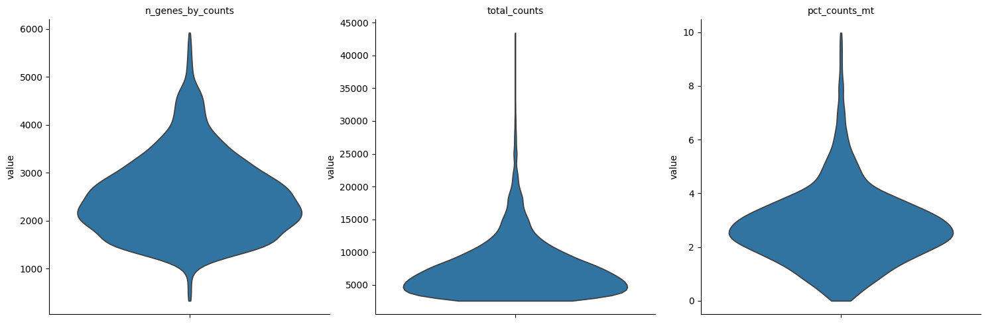

In [12]:
sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt"], size=0, multi_panel=True)

Now, let's define our QC thresholds as following: detected gene number (`n_genes_by_counts`) between 500 and 5000, and mitochondrial transcript percentage (`pct_counts_mt`) less than 5.

In [13]:
adata.obs['PassedQC'] = ((adata.obs['n_genes_by_counts'] > 500) & (adata.obs['n_genes_by_counts'] < 5000) & (adata.obs['pct_counts_mt'] < 5))
adata.obs['PassedQC'].value_counts()

True     4317
False     355
Name: PassedQC, dtype: int64

Next, we subset the data to the subset passing our QC.

In [16]:
adata = adata[adata.obs['PassedQC'],:].copy()
adata.shape

(4317, 33694)

***P.S.*** The rows of an anndata represent the cells, while the columns are representing genes. This is opposite from many genomic data structures in R (including the Seurat object), but it is consistent with the trandition of data science.

Next, we perform data normalization and log-transformation. Note that in `Seurat`, these two steps are performed together in one step, while in `Scanpy`, they are in two steps. Also, do remember to make a copy of the raw count matrix into the `layer` slot, if you think the raw counts may be useful at some point.

In [17]:
adata.layers['counts'] = adata.X.copy()

In [18]:
sc.pp.normalize_total(adata, target_sum=1e4)

In [19]:
sc.pp.log1p(adata)

Next, we will identify the informative genes to characterize the cell heterogeneity. This step is known as highly variable genes identification. In `Scanpy`, this is implemented as the `highly_variable_genes` function in the `sc.pp` module. The function implements several approaches to define variability of genes, which can be controled with the `flavor` parameter. The default value, "seurat", uses the dispersion-based method [implemented in Seurat v1](https://www.nature.com/articles/nbt.3192). Other supported methods include "cell_ranger", the dispersion-based method used in the Cell Ranger analysis, and "seurat_v3", the normalized variance based gene ranking approach used by `Seurat` from its version 3. Please note, that "seurat_v3" expects the raw count matrix as the input. Therefore, if this is run after the X slot has been normalized and transformed, one should specify the raw count matrix with the `layer` parameter. Also, the `n_top_genes` parameter is required, if it is set to `flavor='seurat_v3'`.

In [22]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', layer='counts', n_top_genes=3000)

We can see the variability estimation results in the `.var` slot

In [23]:
adata.var.head()

,Ens,Type,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,highly_variable_rank,means,variances,variances_norm
Symbol,,,,,,,,,,,,,,
RP11-34P13.3,ENSG00000243485,Gene Expression,False,1,0.000214,0.000214,99.978596,1,0.693147,False,NaN,0.000232,0.000232,0.999781
FAM138A,ENSG00000237613,Gene Expression,False,0,0.000000,0.000000,100.000000,0,0.000000,False,NaN,0.000000,0.000000,0.000000
OR4F5,ENSG00000186092,Gene Expression,False,0,0.000000,0.000000,100.000000,0,0.000000,False,NaN,0.000000,0.000000,0.000000
RP11-34P13.7,ENSG00000238009,Gene Expression,False,9,0.001926,0.001925,99.807363,9,2.302585,False,NaN,0.001853,0.001850,0.954035
RP11-34P13.8,ENSG00000239945,Gene Expression,False,0,0.000000,0.000000,100.000000,0,0.000000,False,NaN,0.000000,0.000000,0.000000


Now, it comes the biggest differences in the recommended practice between `Seurat` and `Scanpy`. In `Seurat`, it is suggested to scale expression of each gene across cells to equalize their contribution to the analysis afterwards. In `Scanpy`, this operation is possible, but no longer recommended. In practice, at least based on our experience, scaling the data or not indeed doesn't seem to make huge difference in terms of the final result. However, if you want to apply linear regression to regress out unwanted sources of variation from gene expression before moving onto the next step (with the `sc.pp.regress_out` function), the data scaling will be needed.

And if you decide to run this part, please keep this in mind: you will no longer have a sparse matrix after scaling the data as zeros will no longer be the dominant value in the matrix. That means your object will become substantially larger. Therefore, there are two recommended approaches:
1. Backup the full unscaled log-transformed normalized expression matrix with the `.raw` slot, and then subset the main anndata to only the highly variable genes before running the data scaling
2. Make another copy of the anndata with the `anndata_obj.copy()` function, and perform data subsetting, scaling and PCA on that copy, and afterwards copy the PCA result back to the original anndata object.

The example code here uses appraoch No.1.

Again, do remember that this is not always needed.

In [27]:
adata.layers['lognorm'] = adata.X.copy()
adata.raw = adata
adata = adata[:,adata.var['highly_variable']]
sc.pp.scale(adata)

/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:299: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


***P.S.*** In an anndata, it is required that its `.X` slot and all elements in its `.layers` list have to share the same numbers of rows and columns. That means, this subsetting operation into only the highly variable genes also affects the raw count and log-normalized expression matrices in the `.layers` slot. We use the `.raw` slot to store a freezed snapshot of the data before the subsetting, however, it includes only the `.X` slot which is  the unscaled log-transformed normalized expression matrix. That means, the raw counts of the non-highly variable genes are lost during this process. This complication is another reason why data scaling is not so recommended in `Scanpy`.

Now, we move on to do dimensionality reduction using principal component analysis (PCA), based on the highly variable genes we defined above.

In [32]:
sc.pp.pca(adata, mask_var='highly_variable')

We can visualize the proportion of variations being explained by each of the calculated PCs to decide how many PCs to take into account afterwards.

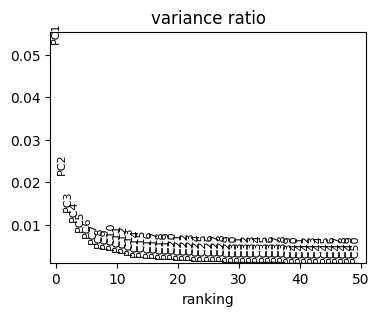

In [35]:
with plt.rc_context({'figure.figsize':(4,3)}):
    sc.pl.pca_variance_ratio(adata, n_pcs=50)

Unfortunately, there is no gold standard or best practice about how to decide how many PCs to consider. Choosing the "elbow point" from the plot is usually the recommendation, but defining the elbow point can already be quite subjective; and PCs after the elbow point can also be informative, particularly if cells in the sample are very heterogeneous and contains rare cell types. Choosing more PCs, on the other hand, slows down the following analysis and potentially introduces more technical noises. Therefore, there is very likely some iterations needed to figure out how many PCs to use later. In this example, we will take the top-20 PCs for the following analysis.

Now, it is time to make a 2D UMAP visualization of the data. Since UMAP (as well as tSNE) tries to recapitulate the neighborhood relationship among cells, which are defined in a higher dimensional space (top PCs), in a lower dimensional (e.g. 2D for visualization) space, we need to firstly identify the nearest neighbors for each cell, based on Euclidean distances on the PCA space. Then, a UMAP will be made based on the reconstructed k-nearest neighbor graph

In [36]:
sc.pp.neighbors(adata, n_pcs=20)

In [37]:
sc.tl.umap(adata)

Now we can visualize some gene expression in this scRNA-seq data set with feature plots on the UMAP

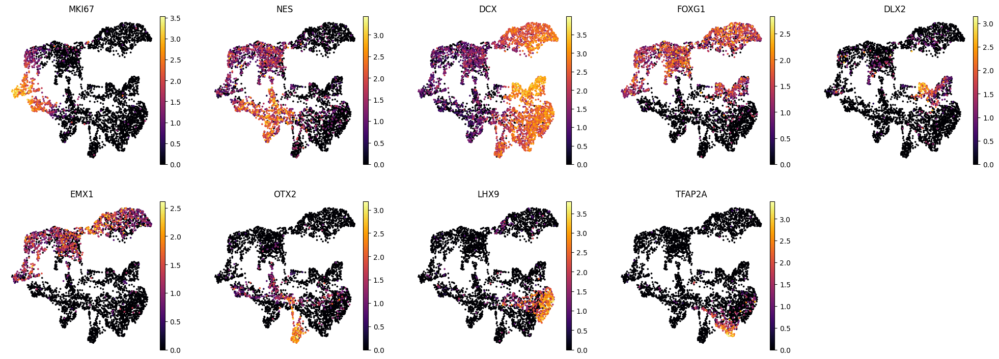

In [39]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.umap(adata, color=["MKI67","NES","DCX","FOXG1","DLX2","EMX1","OTX2","LHX9","TFAP2A"], ncols=5, cmap='inferno', frameon=False)

***P.S.*** In `Seurat`, the `RunUMAP` function calculates the kNN graph by itself instead of using the kNN graph stored in the Seurat object for clustering. This difference would very likely make the UMAPs made with the two frameworks looking quite different from each other.

## Clustering and cell type annotation

We have confirmed the reasonable heterogeneous cell populations in the data, so now we should move on and characterize them comprehensively. This is usually a two step procedure: firstly to define discrete cell populations, i.e. cell clusters; second, to annotate those cell clusters. For scRNA-seq data sets nowadays, due to the large sample size (here one sample means one cell), many traditional clustering approaches such as hierarchical clustering will run into scalability issue. Therefore, for scRNA-seq data, it is much more common to use the graph-based clustering approaches such as Leiden or Louvain. This principle holds in both `Seurat` and `Scanpy`.

Since now we have already generated the kNN graph to make the UMAP embeddings, we can directly move on to do clustering with Leiden. In both Louvain and Leiden clustering, we can control the graininess of clusters by changing the `resolution` parameter. The higher the parameter is, the small clusters one can get. Here, let's try different resolution and see the differences

In [40]:
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_res_0.5')
sc.tl.leiden(adata, resolution=1, key_added='leiden_res_1')
sc.tl.leiden(adata, resolution=2, key_added='leiden_res_2')

/local1/scratch/hezhi/temp/ipykernel_3147315/207670952.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5, key_added='leiden_res_0.5')


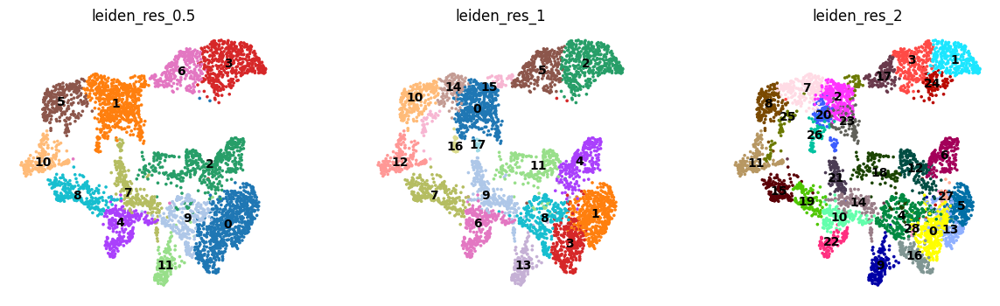

In [42]:
with plt.rc_context({'figure.figsize':(4,4)}):
    sc.pl.umap(adata, color=['leiden_res_0.5','leiden_res_1','leiden_res_2'], frameon=False, legend_loc='on data')

Next, we need to annotate those clusters, and this is not easy. It could be even the most time consuming and difficult part of the whole analysis. In general, there are different strategies one can try.
* Check the expression of canonical cell type and cell state markers in these clusters;
* Identify signature genes, or marker genes, of each identified cell cluster. Based on the identified cluster marker genes, one can do literature search, enrichment analysis, do experiment, ask people around, or ask LLM models like ChatGPT for annotation;
* For each cluster, compare its gene expression profile with existing reference data.

Specifically for the brain organoid system of the example data set here, here is a list of canonical markers one can look at:
  * NES / SOX2: NPC marker
  * NHLH1: neuroblast (new-born neuron) marker
  * DCX / MAP2 / MAPT: neuron marker
  * FOXG1: telencephalon marker
  * EMX1 / EMX2: dorsal telencephalon (cortical) marker
  * EOMES: cortical intermediate progenitor (IP, proliferating neuroblast) marker
  * NEUROD6 / SLC17A7: dorsal telencephalic (cortical) glutamatergic neuron marker
  * BCL11B: deeper layer cortical neuron marker
  * SATB2: upper layer cortical neuron marker
  * RELN: Cajal-Retzius cell marker
  * DLX2 / DLX5: ganglionic eminence (GE) marker
  * ISL1: lateral ganglionic eminence (LGE) inhibitory neuron marker
  * NKX2-1: medial ganglionic eminence (MGE) inhibitory neuron marker
  * RSPO3 / TCF7L2 / LHX5 / LHX9: diencephalon marker (for different neuron subtypes)
  * OTX2 / LMX1A / EN1: midbrain marker (for different neuron subtypes)
  * CYP26A1: Purkinje cell (cerebellar) progenitor marker
  * TFAP2A / CA8: Purkinje cell marker
  * HOXB2 / HOXB5: hindbrain (medulla/pons) and spinal cord marker
  * SLC17A6: glutamatergic neuron marker
  * SLC32A1 / GAD1 / GAD2: GABAergic neuron marker
  * TH: doparminergic neuron marker
  * CHAT / ACHE: cholinergic neuron marker
  * TTR: choroid plexus marker
  * GFAP / AQP4 / S100B: astrocyte marker
  * OLIG1: oligodendrocyte precursor cell marker
  * MBP / SOX10: oligodendrocyte marker
  * SOX10: neural crest derivative marker
  * AIF1: microglia marker
  * CLDN5: endothelial cell marker
  * DCN: mesenchymal cell marker
  * MKI67: cell cycle G2M phase marker (proliferative cells)

Combining this canonical marker gene list, their feature plots and the clustering result (we will use `resolution=0.5` result here), we can already do some judgement. For example, cluster 1 expresses SOX2 and NES, indicating that it is an NPC population. It expresses also FOXG1 and EMX1, which suggests that it is a dorsal telencephalic population. Combining these two messages we can conclude that it is the dorsal telencephalic NPC (or cerebral cortical NPC) population.

To visualize canonical marker gene expression in clusters, feature plot may not be the most efficient and straightforward visualization. In this case, making a dot plot is probably more useful.

In [43]:
marker_genes_dict = {
    'NPC': ["SOX2","NES"],
    'Nbl' : ['NHLH1'],
    'Neuron' : ['DCX','MAP2','MAPT'],
    'Gbl/oRG' : ['TNC','BCAN','HOPX'],
    'Ast' : ['GFAP','AQP4','S100B'],
    'Oligo' : ['OLIG1','OLIG2','MBP'],
    'CPEpi' : ['TTR'],
    'NCD' : ['SOX10'],
    'MG' : ['AIF1'],
    'Endo' : ['CLDN5'],
    'Mesenchyme' : ['DCN'],
    'dTelen' : ['FOXG1','EMX1','EMX2','EOMES','NEUROD6','BCL11B','SATB2'],
    'vTelen' : ['FOXG1','DLX2','DLX5','ISL1','NKX2-1'],
    'Dien' : ['RSPO3','TCF7L2','LHX5','LHX9'],
    'Mesen' : ['LMX1A','OTX2','EN1'],
    'Rhomben' : ['CYP26A1','TFAP2A','CA8','HOXB2','HOXB5'],
    'GlutN' : ['SLC17A7','SLC17A6'],
    'GABAN' : ['SLC32A1','GAD1','GAD2'],
    'DopaN' : ['TH'],
    'CholN' : ['CHAT','ACHE'],
    'G2M' : ['MKI67']
}

categories: 0, 1, 2, etc.
var_group_labels: NPC, Nbl, Neuron, etc.


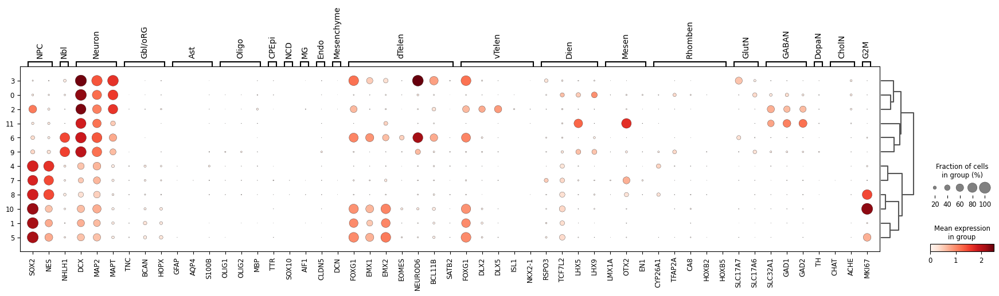

In [44]:
sc.pl.dotplot(adata, marker_genes_dict, "leiden_res_0.5", dendrogram=True)

Based on the dot plot, we can now roughly annotate those clusters as a combination of brain regions and cell classes

In [45]:
cluster2annotation = {
    "0": "nonTelen-N",
    "1": "dTelen-NPC",
    "2": "vTelen-N",
    "3": "dTelen-N",
    "4": "nonTelen-NPC",
    "5": "dTelen-NPC",
    "6": "dTelen-IPC/Nbl",
    "7": "nonTelen-NPC",
    "8": "nonTelen-NPC-G2M",
    "9": "nonTelen-IPC/Nbl",
    "10": "dTelen-NPC-G2M",
    "11": "nonTelen-N-GABA",
}
adata.obs["annot_ct"] = adata.obs["leiden_res_0.5"].map(cluster2annotation).astype("category").cat.reorder_categories(['dTelen-NPC-G2M','dTelen-NPC','dTelen-IPC/Nbl','dTelen-N','vTelen-N','nonTelen-NPC-G2M','nonTelen-NPC','nonTelen-IPC/Nbl','nonTelen-N','nonTelen-N-GABA'])

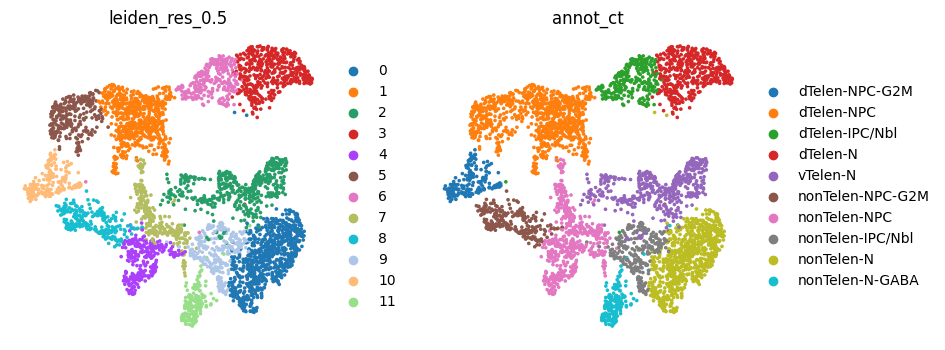

In [46]:
with plt.rc_context({'figure.figsize':(4,4)}):
    sc.pl.umap(adata, color=['leiden_res_0.5','annot_ct'], frameon=False)

In the situation that unfamiliar or unexpected populations appear which are not covered by the canonical markers, you may have to firstly characterize the clusters by getting marker genes which specifically express in the cluster, and then try to annotate the cluster based on prior knowledge about those genes. `Scanpy` also provides the function `rank_genes_groups` in its `.tl` module to perform differential expression analysis (with different optional tests) between clusters to identify marker genes.

In [47]:
sc.tl.rank_genes_groups(adata, "leiden_res_0.5", method="wilcoxon")

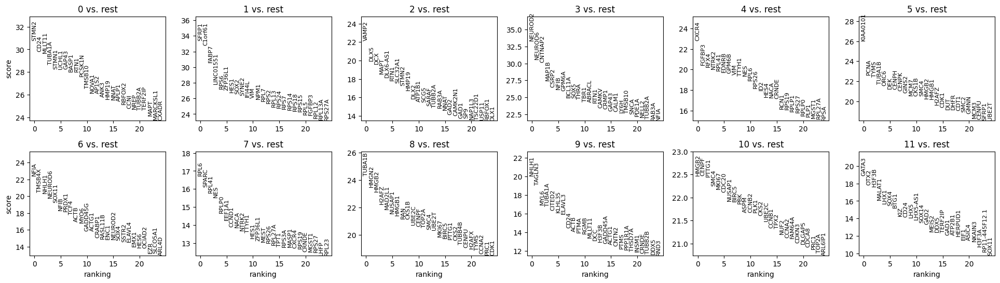

In [52]:
with plt.rc_context({'figure.figsize' : (4,3)}):
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, ncols=6)

## Pseudotime analysis

For samples with cells under active cell state transition, it is very likely to use continuous cell trajectory or cell state continuum, rather than distinct cell populations. From the feature plots above, we can also see these continuous trajectories, for example, the dorsal telencephalic NPC to IPC/neuroblast to neuron trajectory, which reflects the neurogenesis process to generate cortical glutamatergic neurons in human early brain development. Although we can provide distinct cell type labels to those cells, considering all cells in these related cell clusters as a union and then placing cells in this trajectory in certain order which reflects the progress of their underlying cell state transition is probably a better approach to discribe this biological process. In that case, it is more informative to perform so-called pseudotemporal cell ordering, or pseudotime analysis on those cells.

There are quite a lot of different methods for pseudotime analysis. Although most of the commonly used methods are R-based, there are also great methods with implementation in Python or even solely available in Python. In this section we will showcase [diffusion pseudotime (DPT)](https://www.nature.com/articles/nmeth.3971), which is based on random walk on a neighbor graph of cells denoised by diffusion map. This method was originally developed in R by the Theis lab, and reimplemented in `Scanpy` which was developed and is maintained by the same lab.

There are other methods such as [Palantir](https://www.nature.com/articles/s41587-019-0068-4) developed by the Pe'er lab. Palantir is solely implemented in Python as the `palantir` package. It aims to estimate terminal cell states from the data and estimate fate probabilities towards each of the terminal cell states for every cell in the data; and as the first step of this analysis, it estimates pseudotime for each cell by identifying the shortest paths on the diffusion neighborhood graph of cells. We will showcase its application for trajectory and fate probability analysis later.

Diffusion map and DPT analysis are implemented in `Scanpy` as the `diffmap` and `dpt` function in the `tl` module. It has very similar functionality as the `DiffusionMap` and `DPT` functions in the `destiny` R package. The DPT approach firstly calculates a transition probability matrix of cells with a given cell embeddings, and then use diffusion map to generate a denoised probability matrix. Next, it performs random walk from a pre-defined root cell, which should represent the cell with the very initial cell state of the transitioning process. As the first step, we should run the `diffmap` function. It will perform the diffusion map analysis on the k-nearest neighbor graph we reconstructed using the `scanpy.pp.neighbors` function.

In [55]:
sc.tl.diffmap(adata, n_comps=20)

One major difference between the R and Python implementation is that, the R implementation includes automatic root cell inference, while the Python implementation doesn't. That means, you need to either manually define a cell (e.g. one of the progenitors) as the root cell, or re-implement the automatic root cell inference approach as in the R implementation, as the example function below:

In [53]:
import random
import numpy as np
import pandas as pd
def random_root(adata, seed = None, neighbors_key=None, idx_subset = None):
    if seed is not None:
        random.seed(seed)
    iroot_bak = None
    if 'iroot' in adata.uns.keys():
        iroot_bak = adata.uns['iroot'].copy()
    dpt_bak = None
    if 'dpt_pseudotime' in adata.obs.columns:
        dpt_bak = adata.obs['dpt_pseudotime'].copy()
    
    idx = np.random.choice(list(range(adata.shape[0])))
    adata.uns['iroot'] = idx
    sc.tl.dpt(adata, neighbors_key=neighbors_key)
    dpt = adata.obs['dpt_pseudotime']
    if idx_subset is not None:
        dpt = dpt.iloc[idx_subset]
    idx_max_dpt = np.argmax(dpt)
    if idx_subset is not None:
        idx_max_dpt = idx_subset[idx_max_dpt]
    
    del adata.uns['iroot']
    del adata.obs['dpt_pseudotime']
    if iroot_bak is not None:
        adata.uns['iroot'] = iroot_bak.copy()
    if dpt_bak is not None:
        adata.obs['dpt_pseudotime'] = dpt_bak.copy()
    
    return idx_max_dpt

And just to mention, this function also allows setting restriction to root cell candidates, so that we can require the root cell candidates to be only the NPCs.

In [57]:
idx_subset = np.where(np.isin(adata.obs['annot_ct'], ['dTelen-NPC-G2M','dTelen-NPC','nonTelen-NPC-G2M','nonTelen-NPC']))[0]
idxs_rand_root = np.apply_along_axis(lambda x: random_root(adata, idx_subset=idx_subset),
                                     1, np.array(range(1000))[:,None])
adata.uns['iroot'] = np.argmax(np.bincount(idxs_rand_root))
adata.obs['is_DPTRoot'] = False
adata.obs.loc[adata.obs_names[adata.uns['iroot']],'is_DPTRoot'] = True

We can visualize the selected root cell on the UMAP

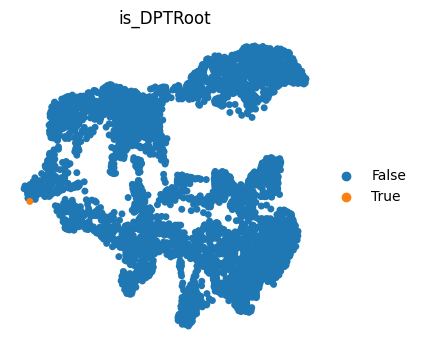

In [61]:
with plt.rc_context({'figure.figsize':(4,4)}):
    sc.pl.umap(adata, color='is_DPTRoot', frameon=False, size=100)

Now we have everything we need to run DPT and visualize the estimated pseudotimes

In [62]:
sc.tl.dpt(adata, n_dcs=20)

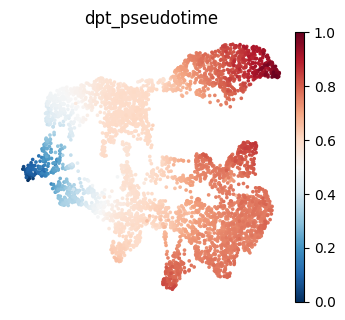

In [67]:
with plt.rc_context({'figure.figsize':(4,3.5)}):
    sc.pl.umap(adata, color='dpt_pseudotime', frameon=False, cmap='RdBu_r')

Pseudotime analysis tries to summarize variations of the whole data set into one single dimension. Clearly, this could fail or provide misleading results if the data set includes a branched or even multiple disconnected trajectories. If that happens, differences between different trajectories or trajectory branches may strongly confound the pseudotime analysis result, making the estimated pseudotime unreliable. In that case, what we can try is to extract only a data subset of interest which includes only one unbranched trajectory, and estimate pseudotimes for only those cells. For example, we can extract only the dorsal telencephalic populations in the example data set, and do pseudotime analysis for them only.

In [69]:
adata_dtelen = adata[np.isin(adata.obs['annot_ct'], ['dTelen-NPC-G2M','dTelen-NPC','dTelen-IPC/Nbl','dTelen-N']),:].copy()
del adata_dtelen.uns['iroot']
sc.pp.neighbors(adata_dtelen)
sc.tl.diffmap(adata_dtelen, n_comps=10)

idx_subset = np.where(np.isin(adata_dtelen.obs['annot_ct'], ['dTelen-NPC-G2M','dTelen-NPC']))[0]
idxs_rand_root = np.apply_along_axis(lambda x: random_root(adata_dtelen, idx_subset=idx_subset),
                                     1, np.array(range(1000))[:,None])
adata_dtelen.uns['iroot'] = np.argmax(np.bincount(idxs_rand_root))

sc.tl.dpt(adata_dtelen, n_dcs=10)

In [72]:
adata.obs['dpt_pseudotime_dtelen'] = 0
adata.obs.loc[adata_dtelen.obs_names,'dpt_pseudotime_dtelen'] = adata_dtelen.obs['dpt_pseudotime']

Now we can compare the two pseudotimes by feature plots and also correlations.

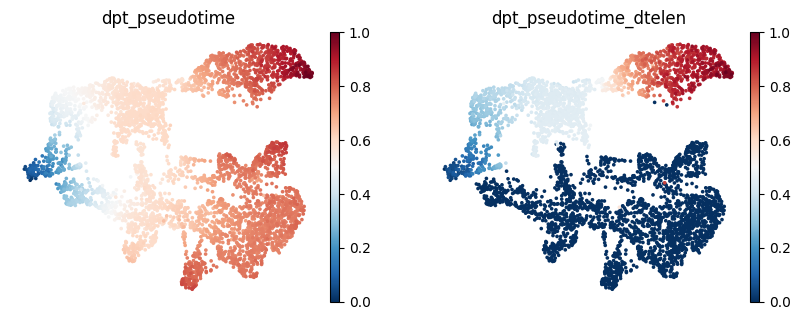

In [75]:
with plt.rc_context({'figure.figsize':(4,3.5)}):
    sc.pl.umap(adata, color=['dpt_pseudotime','dpt_pseudotime_dtelen'], frameon=False, cmap='RdBu_r', ncols=2)

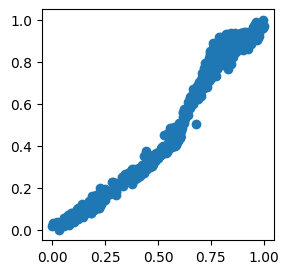

In [78]:
with plt.rc_context({'figure.figsize':(3,3)}):
    plt.scatter(adata.obs['dpt_pseudotime'][adata_dtelen.obs_names], adata.obs['dpt_pseudotime_dtelen'][adata_dtelen.obs_names])
    plt.show()

In [79]:
from scipy.stats import pearsonr, spearmanr
[
    pearsonr(adata.obs['dpt_pseudotime'][adata_dtelen.obs_names], adata.obs['dpt_pseudotime_dtelen'][adata_dtelen.obs_names]),
    spearmanr(adata.obs['dpt_pseudotime'][adata_dtelen.obs_names], adata.obs['dpt_pseudotime_dtelen'][adata_dtelen.obs_names])
]

[PearsonRResult(statistic=0.9578534223934532, pvalue=0.0),
 SignificanceResult(statistic=0.9827718166271636, pvalue=0.0)]

So in this example data set, these two pseudotimes look very similar.

## Trajectory and fate probability analysis 

The clustering analysis described above is the most commonly used way to summarize the cell type/state heterogeneity in the data. However, the basic clustering analysis does not provide the information about how each cluster of cells may have connected with each other. This is very important for understanding dynamical systems related to development and regeneration, for instance.

There are different ways to complement this issue. One strategy is to rely on the clustering results, and apply certain statistcs to evaluate the strength of connectivity between every two clusters. In most of the time, this connectivity is defined by how likely cells in one cluster being one of the nearest neighbors of a cell in another cluster. This is what [PAGA](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1663-x), which is now a part of the `Scanpy` package (`sc.tl.paga`) does, and we will showcase how to use it in the following section.

Another option, which is probably the most commonly used strategy, is to do trajectory analysis. Instead of defining clusters, the trajectory analysis describes the cell type/state landscape as a tree or tree-like graph, with the very initial cell state as the root and every time when two different cell types/states are derived from the same ancestor state, a branching point is defined. There are quite some tools available for trajectory analysis. There have been many great tools developed for trajectory analysis, such as [monocle](https://cole-trapnell-lab.github.io/monocle3/), [URD](https://schierlab.biozentrum.unibas.ch/urd), and [Slingshot](https://bioconductor.org/packages/release/bioc/html/slingshot.html). Unfortunately, many of them, such as monocle and URD, are only available in R. Slingshot has the [Python implementation](https://github.com/mossjacob/pyslingshot) now as the `pyslingshot` packages, which we will also showcase its application on the example data set.

There is also the fate probability analysis that complements the other strategies. While the trajectory analysis assumes a cell doing one decision per branch point and exactly at the branch point, the fate probability analysis assume a cell doing continuous decision making. [FateID](https://www.nature.com/articles/nmeth.4662) was the first tool attempting to address it with this strategy, which does iterative fate bias inferences from the terminal cell fates based on random forest classifier. It is based on R, and has huge scalability issue and is inapplicable to large data set. Nowadays, there are other methods being developed to estimate cell fate probability, and one of the most popular ones is [Palantir](https://www.nature.com/articles/s41587-019-0068-4), which has been implemented in Python as the `palantir` package. It firstly estimates pseudotime for cells similar to diffusion pseudotime. Next, it adapts a Markov chain random walk procedure to identify stationary states (the terminal states), and absorbing probabilities towards different terminal states are estimated for each cell. We will also showcase its application on the example data set.

### PAGA

To run PAGA, the given anndata should include cell grouping (as a column in `.obs`, e.g. clustering result or cell type annotation) and a k-nearest neighbor graph (generated by `sc.pp.neighbors`, for example). As we have generated both in the previous section, here we just need to call `sc.tl.paga` for the analysis.

In [190]:
sc.tl.paga(adata, groups='annot_ct')

Next we can visualize the results as a force-directed layout of a graph of cell types. Widths of edges indicate estimated strengths of the connectivities.

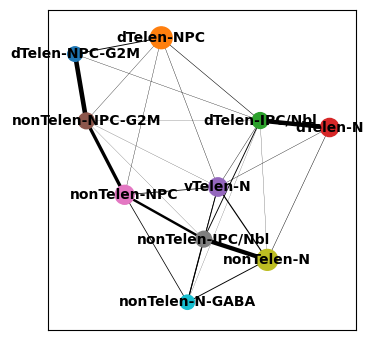

In [191]:
with plt.rc_context({'figure.figsize':(4,4)}):
    sc.pl.paga(adata)

We can also print out the cluster pairs with their inter-cluster connectivity over a certain threshold (here, 0.1)

In [192]:
from scipy import sparse
connected = adata.uns['paga']['connectivities'] > 0.1
connected = (connected + connected.T) > 0
idx_row, idx_col, dat = sparse.find(connected)
idx = (idx_row >= idx_col)
connected_celltypes = pd.DataFrame({ 'node1' : adata.obs['annot_ct'].cat.categories[idx_row[idx]],
                                     'node2' : adata.obs['annot_ct'].cat.categories[idx_col[idx]]})
connected_celltypes

,node1,node2
0,dTelen-N,dTelen-IPC/Nbl
1,nonTelen-NPC-G2M,dTelen-NPC-G2M
2,nonTelen-NPC,nonTelen-NPC-G2M
3,nonTelen-IPC/Nbl,nonTelen-NPC
4,nonTelen-N,vTelen-N
5,nonTelen-N,nonTelen-IPC/Nbl


This is obviously not ideal. This can happen very often. Essentially what PAGA tries to quantify is the similarity between the most similar sub-populations of every cell cluster pair. If there are transcriptomic similar populations but at different branches (e.g. NPCs of different brain regions), they can also show high connectivities, sometimes even higher than their connectivities to cell populations of the same branch when they have large cell numbers.

### Slingshot

Slingshot is similar to monocle (version1), both uses the minimum spanning tree (MST) approach to infer trajectories. Different from monocle which applies MST to cells, Slingshot applies MST on the cluster-level. After getting the inferred 'lineages' (the trajectory from initial cell population towards each of the end states), Slingshot fits principal curves, one for each 'lineage', jointly for all 'lineages'. By projecting each cell to the principal curves, a pseudotime is assigned to the cell as its distance from the root along the curve.

The Python implementation of Slignshot is the `pyslingshot` package. The main data structure of `pyslingshot` is the Slingshot object, which can be created from an anndata. A start node, which specifies the cluster index of the root cell type, is also necessary to provide.

In [193]:
from pyslingshot import Slingshot

In [233]:
slingshot = Slingshot(adata,
                      celltype_key="annot_ct",
                      obsm_key="X_umap",
                      start_node=np.where(adata.obs['annot_ct'].cat.categories.sort_values() == adata.obs['annot_ct'][adata.uns['iroot']])[0][0])

In [255]:
slingshot.fit(num_epochs=5)

  0%|          | 0/5 [00:00<?, ?it/s]

/local1/scratch/hezhi/temp/ipykernel_3147315/2485479704.py:9: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


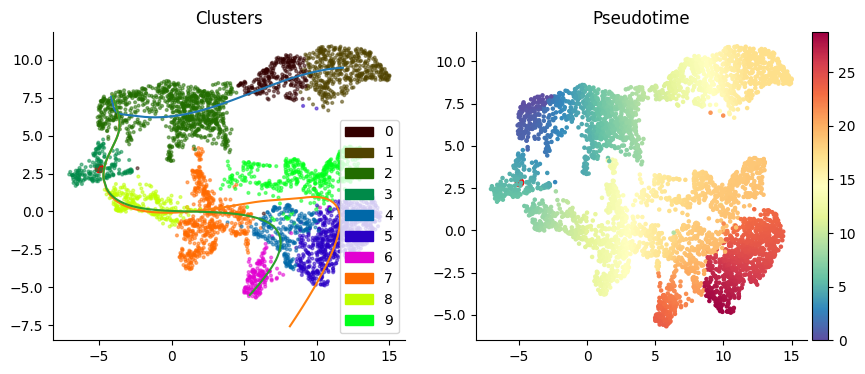

In [256]:
%matplotlib inline

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
axes[0].set_title('Clusters')
axes[1].set_title('Pseudotime')
slingshot.plotter.curves(axes[0], slingshot.curves)
slingshot.plotter.clusters(axes[0], labels=np.arange(slingshot.num_clusters), s=4, alpha=0.5)
slingshot.plotter.clusters(axes[1], color_mode='pseudotime', s=5)
fig.show()

We can check which cell types are considered to be included in each 'lineage', by calling the `.list_lineages()` function with the cluster index to label mapping provided.

In [257]:
slingshot.list_lineages(cluster_to_label=adata.obs['annot_ct'].cat.categories.sort_values())

dTelen-NPC-G2M, dTelen-NPC, dTelen-IPC/Nbl, dTelen-N
dTelen-NPC-G2M, nonTelen-NPC-G2M, nonTelen-NPC, vTelen-N, nonTelen-IPC/Nbl, nonTelen-N
dTelen-NPC-G2M, nonTelen-NPC-G2M, nonTelen-NPC, vTelen-N, nonTelen-IPC/Nbl, nonTelen-N-GABA


The inferred result is not fully correct biologically, as vTelen-N, which should be on its own as a separated population, is grouped with the non-telencephalic populations. This, however, is an expected error, because of the fact that no vTelen progenitor population is available breaks the very first assumption of Slingshot, as well as many other trajectory inference method, that is, the trajectories, branched or unbranched, have one single root and all cell types should connect to the root through certain paths. Our example data set doesn't have such as single root, and this is particularly true for the ventral telencephalic neurons. And at least, the method successfuly identifies the complete dorsal telencephalic trajectory.

We can extract the estimated pseudotimes by Slingshot, and compare them with the diffusion pseudotime we obtained earlier.

In [244]:
adata.obs['slingshot_pseudotime'] = slingshot.unified_pseudotime

/local1/scratch/hezhi/temp/ipykernel_3147315/3438043430.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


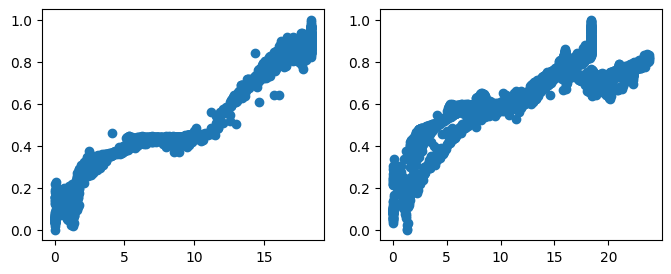

In [246]:
fig, axes = plt.subplots(1,2, figsize=(8,3))
axes[0].scatter(adata.obs['slingshot_pseudotime'][adata_dtelen.obs_names], adata.obs['dpt_pseudotime_dtelen'][adata_dtelen.obs_names])
axes[1].scatter(adata.obs['slingshot_pseudotime'], adata.obs['dpt_pseudotime'])
fig.show()

In [248]:
from scipy.stats import pearsonr, spearmanr
[
    spearmanr(adata.obs['slingshot_pseudotime'][adata_dtelen.obs_names], adata.obs['dpt_pseudotime_dtelen'][adata_dtelen.obs_names]),
    spearmanr(adata.obs['dpt_pseudotime'], adata.obs['slingshot_pseudotime'])
]

[SignificanceResult(statistic=0.9698670758986618, pvalue=0.0),
 SignificanceResult(statistic=0.8437219568615106, pvalue=0.0)]

So the pseudotime estimated by Slingshot looks similar to the diffusion pseudotime.

***IMPORTANT*** Slingshot has one huge limitation that people should keep in mind. It relies on principal curve regression to project cluster-level trajectory to cells and estimate pseudotimes, and the principal curve analysis supports only two dimensions. It means that Slingshot can take only a two-dimensional representation of the data as the input. There are two options. The first one is to use the first two components of PCA and diffusion map analysis. The limitation is clear, that with only these two components the cell heterogeneity and relationship between cell types may not be fully representated. The other option is to use a non-linear dimensionality reduction method, e.g. UMAP and tSNE, to summarize data onto a two-dimensional representation. This is actually the more common way that people use. Its problem is also clear: many non-linear dimensionality reduction approaches, including UMAP and tSNE, are not quantitative, and therefore relationship revealed in that space may not fully reflect the actual data. Also, sometimes the trajectory structure is so complex that more than two dimensions are required to fully show reveal the transcriptomic similarities and trajectories at the same time. In that case, any method relying on 2D data representations, including Slingshot, will fail.

### Palantir

To run Palantir, the first step is to perform diffusion map analysis in order to generate a denoised transition probability matrix. `Palantir` has its own implementation of diffusion map analysis as `palantir.utils.run_diffusion_maps`, but we can also use the Scanpy implementation, which we have done before. `Palantir` also provides plotting functions, including `palantir.plot.plot_diffusion_components` which visualizes each diffusion component on the cell embedding (`X_umap` by default).

In [250]:
import palantir

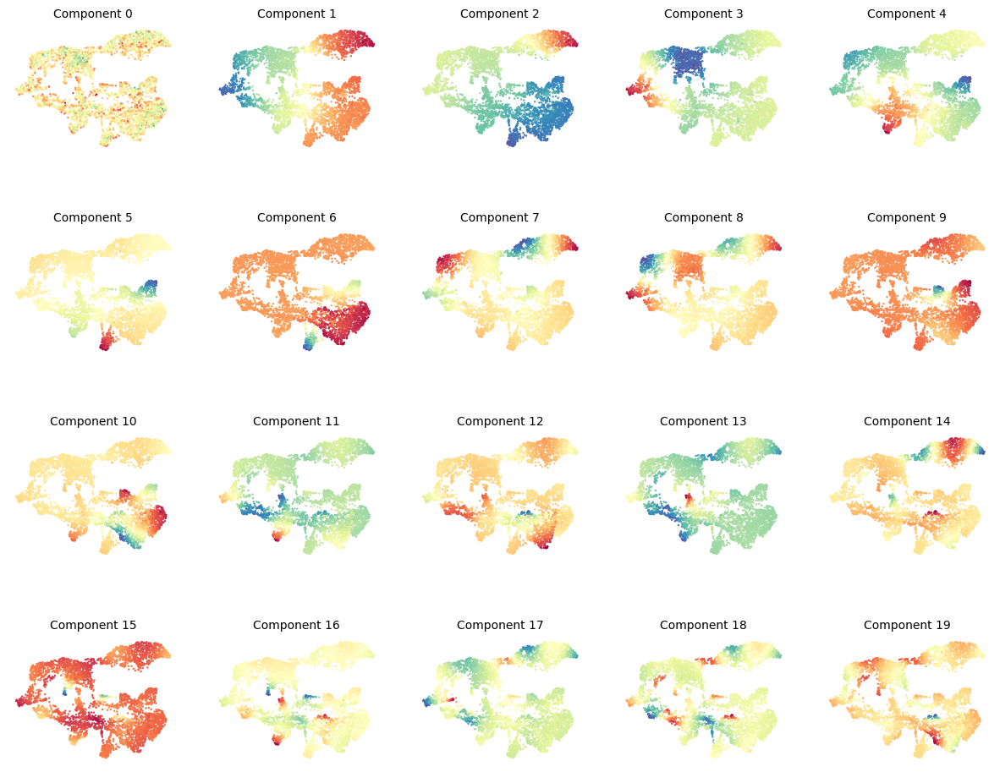

In [254]:
palantir.plot.plot_diffusion_components(adata, dm_res='X_diffmap', embedding_basis='X_umap')
plt.show()

Next, to estimate fate probabilities, `Palantir` needs to know which and where the terminal cell states are. There are two ways to provide this information. The first way is to use the `palantir.core.identify_terminal_states` function to infer terminal states. For that, one needs to provide two input: (1) the multi-scale space of the data, which can be estimated with `palantir.utils.determine_multiscale_space`; and (2) an early cell ID, which we can use the root cell we identified earlier for DPT and Slingshot analysis.

In [384]:
ms_data = palantir.utils.determine_multiscale_space(adata, eigval_key='diffmap_evals', eigvec_key='X_diffmap', n_eigs=5)

***P.S.*** The Markov chain random walk by Palantir is quite sensitive to noises in the transition matrix. Therefore, one shall use only the top diffusion components. The diffusion component feature plots can help to decide how many top components to use.

In [385]:
terminal_states, excluded_boundaries = palantir.core.identify_terminal_states(ms_data=ms_data, early_cell=adata.obs_names[adata.uns['iroot']], n_jobs=1, num_waypoints=adata.shape[0], knn=20)

Shortest path distances using 20-nearest neighbor graph...
Time for shortest paths: 0.20225446224212645 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Markov chain construction...
Identification of terminal states...


***P.S.*** Waypoints are randomly subsampled data points to downscale the data to improve the scalability of Markov chain construction and random walk. The closer it is to the full data size, the closer it is to the actual data. As the example data set is not huge, we can just set it to the same as the cell number we have.

We can check which cells are inferred as representatives of terminal states

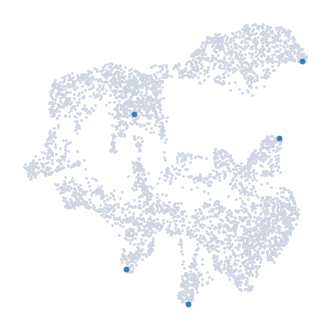

In [386]:
palantir.plot.highlight_cells_on_umap(adata, terminal_states, embedding_basis='X_umap')
plt.show()

Not too bad. The dTelen-N, vTelen-N and nonTelen-N-GABA have been captured. It is not perfect though, as some progenitor populations are also selected. Since we know for this example data set what the terminal cell states are, let's directly specify terminal states, as the neuron with the highest pseudotime at each neuronal population.

In [387]:
neuron_ct = ["nonTelen-N","vTelen-N","dTelen-N","nonTelen-N-GABA"]
terminal_states_neurons = dict(zip([ adata[adata.obs['annot_ct']==x,:].obs['dpt_pseudotime'].idxmax() for x in neuron_ct ],
                                   neuron_ct))

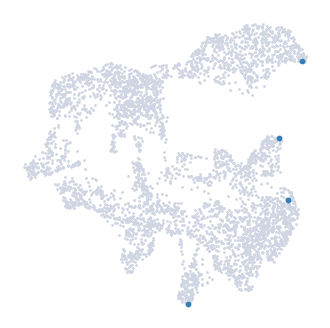

In [388]:
palantir.plot.highlight_cells_on_umap(adata, list(terminal_states_neurons.keys()), embedding_basis='X_umap')
plt.show()

In [389]:
pr_res = palantir.core.run_palantir(adata,
                                    early_cell=adata.obs_names[adata.uns['iroot']],
                                    use_early_cell_as_start=False,
                                    terminal_states=terminal_states_neurons,
                                    num_waypoints=adata.shape[0],
                                    eigvec_key='DM_EigenVectors_multiscaled',
                                    knn=20,
                                    n_jobs=1)

Sampling and flocking waypoints...
Time for determining waypoints: 0.10061195294062296 minutes
Determining pseudotime...
Shortest path distances using 20-nearest neighbor graph...
Time for shortest paths: 0.1951849619547526 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


The estimated fate probabilities are stored as a `pd.DataFrame` in the `.obsm` list, which is by default called 'palantir_fate_probabilities'.

In [390]:
adata.obsm['palantir_fate_probabilities'].head()

,nonTelen-N,vTelen-N,nonTelen-N-GABA,dTelen-N
CellID,,,,
AAACCTGAGAATGTTG-1,0.546249,0.061723,0.313616,0.078412
AAACCTGAGAGCCTAG-1,0.546447,0.061718,0.314464,0.077371
AAACCTGAGTAATCCC-1,0.808407,0.075804,0.094761,0.021027
AAACCTGCACACTGCG-1,0.815458,0.074141,0.090408,0.019992
AAACCTGCATCGGAAG-1,0.324532,0.039523,0.072948,0.562997


We can then visualize the results with the `palantir.plot.plot_palantir_results` function

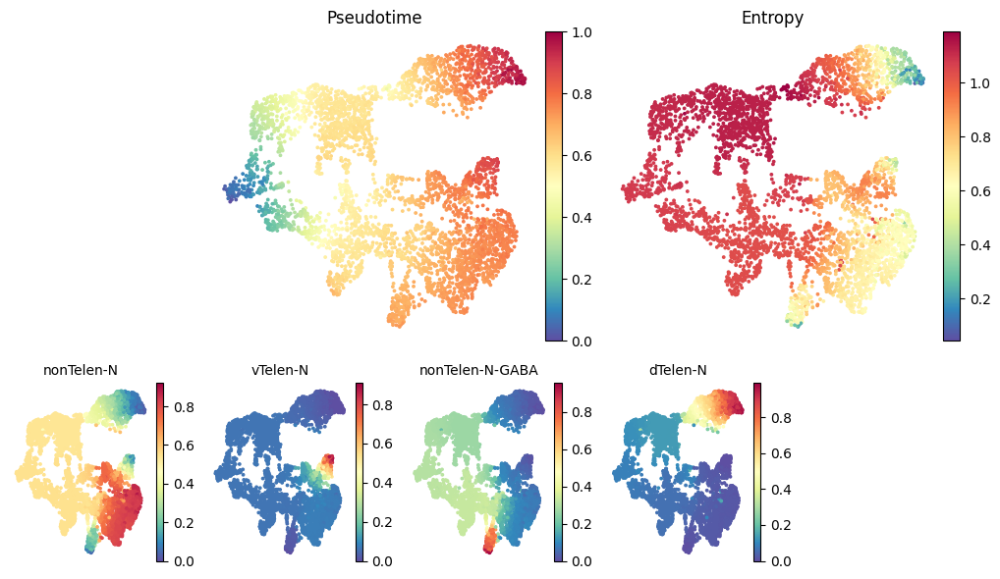

In [391]:
palantir.plot.plot_palantir_results(adata, s=3)
plt.show()

It doesn't look too bad! The estimated entropy (high entropy means less fate commitment) also highlights the progenitor populations in the data which makes sense. Meanwhile we also have to acknowledge that the inference results are not fully accurate. For example the dorsal telencephalic progenitors show high estimated fate probabilities towards non-telencephalic neurons. This is likely due to the narrow "bottleneck" at the middle of the dorsal telencephalic branch, which artificially decreases the chance of a fully data-driven random walk from the progenitors towards the dorsal telencephalic neurons. This also highlights the limitations of trajectory inference methods, and we have to be cautious in interpreting the results.

With the estimated fate probabilities, `Palantir` also supports converting the fate probabilities to branches.

In [398]:
masks = palantir.presults.select_branch_cells(adata, q=0.02, eps=0.02)

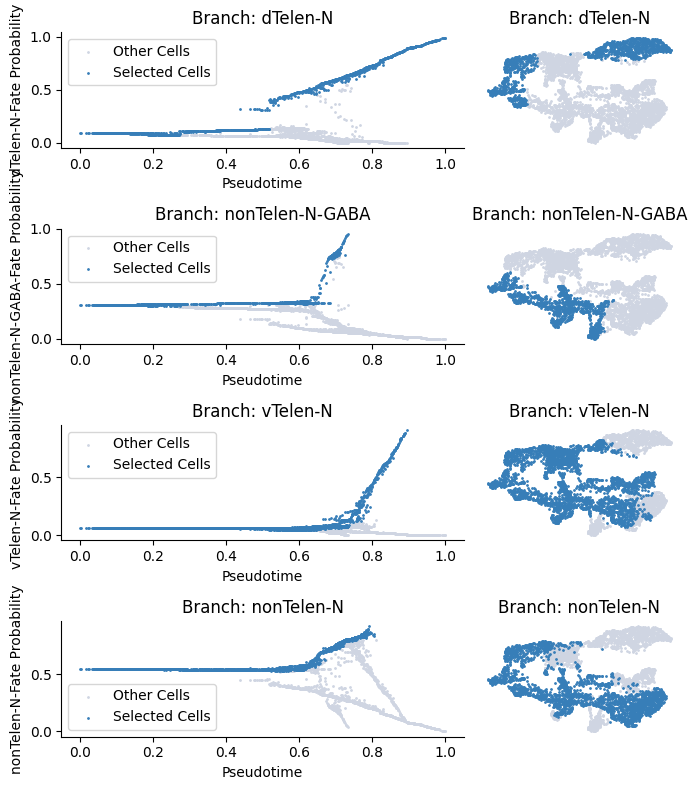

In [405]:
palantir.plot.plot_branch_selection(adata, figsize=(7,2), s=1)
plt.show()

***P.S.*** The results don't look very ideal, but this is just a showcase of the `Palantir` functionality.

Another interesting visualization that `Palantir` provides is the gene trend plots with different branches separated. In brief, for each gene, a summary expression curve along the estimated pseudotime is shown for every branch separately. Based on the fate probability, every cell will have different contribution to different branches. This allows to visualize how driver genes of different branches show different expression behaviors on different branches, for example.

In [407]:
gene_trends = palantir.presults.compute_gene_trends(adata)

nonTelen-N
[2025-03-05 13:54:53,505] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (2,520) and rank = 1.0.
[2025-03-05 13:54:53,506] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-03-05 13:54:54,603] [INFO    ] Sigma interpreted as element-wise standard deviation.
vTelen-N
[2025-03-05 13:54:55,037] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (2,980) and rank = 1.0.
[2025-03-05 13:54:55,038] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-03-05 13:54:55,416] [INFO    ] Sigma interpreted as element-wise standard deviation.
nonTelen-N-GABA
[2025-03-05 13:54:55,593] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (1,159) and rank = 1.0.
[2025-03-05 13:54:55,593] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-03-05 13:54:55,973] [INFO    ] Sigma interpreted as element-wise standard deviation.
dTelen-N
[2025-03-05 13:54:56,138] [INFO    ] Using sparse Gaussian

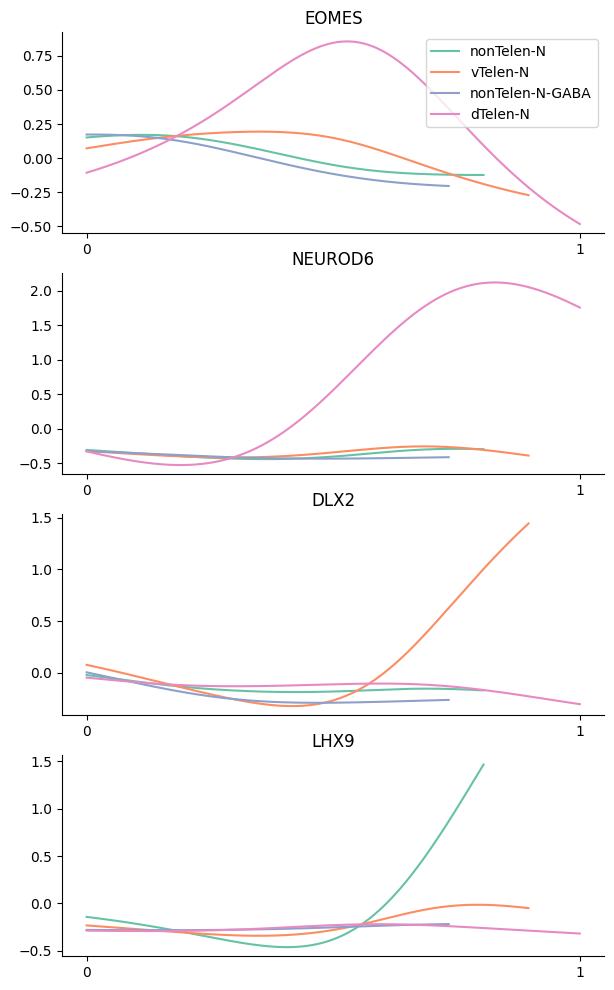

In [409]:
genes = ["EOMES","NEUROD6","DLX2","LHX9"]
palantir.plot.plot_gene_trends(adata, genes)
plt.show()

## Save the final anndata

In [410]:
adata.write_h5ad('DS1_processed.h5ad')

# Part 2: Analyzing a multi-batch scRNA-seq data set

Nowadays, it is very rare that one would only do one scRNA-seq experiment and generate only one scRNA-seq data. The reasons are simple. First of all, current scRNA-seq technology only provides a molecular snapshot on limited measured samples at one time. To measure many samples across multiple experiments and different conditions, joint analysis of scRNA-seq data of multiple experiment on different samples is usually required. Although some experimental strategy, e.g. cell hashing, as well as computational demultiplexing methods such as demuxlet and scSplit to some extend allow pooling multiple samples together for the scRNA-seq library preparation and sequencing, it is unavoidable that certain steps, e.g. tissue dissociation, would have to be done separately for diffent samples. Therefore, just like when dealing with bulk RNA-seq data, batch effect is usually a critical confounder of the result that one has to resolve.

In this part of the tutorial, several scRNA-seq integration methods would be introduced. We will use DS1 which has been described in the first part of the tutorial, together with DS2 which you should have analyzed following this vignette. Please be aware that so far there is no 'best' integration method for all scenarios. It is therefore important to try different methods and compare, to at the end choose the one that works the best for every specific case.

## Load and merge different batches into a joint data set

Here we are going to load the DS1 and DS2 data which have been QCed, and then merge them into one single anndata

In [91]:
adata_DS1 = sc.read_h5ad('DS1_raw.h5ad')
adata_DS2 = sc.read_h5ad('DS2_raw.h5ad')

In [92]:
adata_DS1.obs['batch'] = 'DS1'
adata_DS2.obs['batch'] = 'DS2'
adata = anndata.concat([adata_DS1, adata_DS2], join='inner', keys=['DS1','DS2'], index_unique="_")

We can check some brief information after the data concatenation

In [98]:
[
    adata_DS1.shape,
    adata_DS2.shape,
    adata.shape,
    adata.obs['batch'].value_counts()
]

[(4317, 33694),
 (3550, 33694),
 (7867, 33694),
 DS1    4317
 DS2    3550
 Name: batch, dtype: int64]

In [99]:
adata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,PassedQC,batch
AAACCTGAGAATGTTG-1_DS1,3287,8.098035,16752.0,9.726333,34.646609,47.683859,59.968959,73.101719,184.0,5.220356,1.098376,True,DS1
AAACCTGAGAGCCTAG-1_DS1,3399,8.131531,13533.0,9.512960,26.335624,39.178305,51.548068,66.400650,264.0,5.579730,1.950787,True,DS1
AAACCTGAGTAATCCC-1_DS1,1558,7.351800,3098.0,8.038835,26.823757,37.056165,48.644287,65.848935,76.0,4.343805,2.453196,True,DS1
AAACCTGCACACTGCG-1_DS1,2015,7.608871,5158.0,8.548498,34.373788,44.746026,54.711128,68.417991,194.0,5.273000,3.761148,True,DS1
AAACCTGCATCGGAAG-1_DS1,2322,7.750615,6966.0,8.848940,31.266150,43.554407,55.799598,69.279357,152.0,5.030438,2.182027,True,DS1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGCGCTTG-1_DS2,2402,7.784473,7245.0,8.888205,28.419600,41.200828,52.477571,67.522429,116.0,4.762174,1.601104,True,DS2
TTTGTCATCAAGATCC-1_DS2,1998,7.600402,5188.0,8.554296,28.084040,38.010794,49.595220,67.058597,73.0,4.304065,1.407093,True,DS2
TTTGTCATCGTAGATC-1_DS2,1615,7.387709,3649.0,8.202482,28.473554,40.970129,51.849822,69.443683,96.0,4.574711,2.630858,True,DS2
TTTGTCATCTAACTTC-1_DS2,1342,7.202661,2838.0,7.951207,28.118393,39.675828,52.642706,70.331219,87.0,4.477337,3.065539,True,DS2


## From the raw counts to UMAP

In the ideal situation without any batch effect, the analysis of a multi-batch scRNA-seq data set is pretty much the same as that of a single-batch scRNA-seq data set, which has been described above. In brief,
1. Quality control and filtering (has been done for the two example data sets)
2. Data normalization with `sc.pp.normalize_total`
3. Log-transformation with `sc.pp.log1p`
4. Highly variable genes identification with `sc.pp.highly_variable_genes`
5. PCA with `sc.pp.pca`
6. K-nearest neighbor graph reconstruction with `sc.pp.neighbors`
7. UMAP with `sc.tl.umap`

We will therefore go through all those steps very quickly.

In [100]:
adata.layers['counts'] = adata.X.copy()

In [101]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', layer='counts', n_top_genes=3000, batch_key='batch')
sc.pp.pca(adata, n_comps=20, mask_var='highly_variable')
sc.pp.neighbors(adata)
sc.tl.umap(adata)

***P.S.*** For multi-batch data sets, it is quite common to set the `batch_key` parameter to be the batch/sample column in the cell metadata in the `sc.pp.highly_variable_genes` function. This will ask the function to quantify expression variability of genes per batch/sample and obtain the intersects. The rationale is that, if there is technical batch effect among different batches, many global highly variable genes may actually represent the batch effect. The potential limitation of setting this parameter is that if different samples/batches include different cell type populations, marker genes of those populations may not be identified in the batches/samples which don't have the cell type, limiting the capacity of the analysis to identify those cell types.

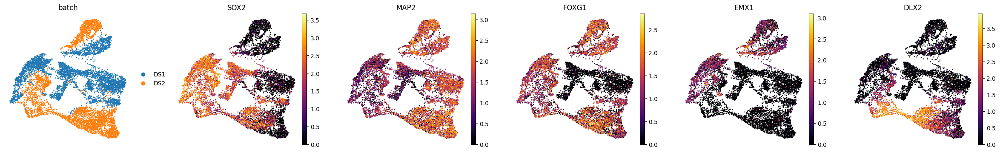

In [104]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.umap(adata, color=['batch','SOX2','MAP2','FOXG1','EMX1','DLX2'], cmap='inferno', ncols=6, frameon=False)

We can now easily find out the issue from these feature plots. The two data sets show basically no overlap on the UMAP. However, many cell populations from the two data sets in fact show very similar marker expression patterns. For example, the top populations from both data sets express MAP2, FOXG1 and EMX1, suggesting that they are both dorsal telencephalic neurons. Still, they are separated on the UMAP. This is a strong indication that there is substantial batch effect between these two data sets.

## Data integration or batch effect correction

There have been many different data integration or batch effect correction methods being developed by different labs. Unfortunately, not all of them have Python implementations. For example, `Seurat` has its own canonical correlation analysis (CCA) or recipical PCA (rPCA) and anchoring based integration approach, which is only available via `Seurat` and the Seurat object in R. Still, most of the most commonly used methods do have the Python implementation, many of which have wrapper functions provided by `Scanpy`.

In this section, we will showcase how to apply the data integration methods available in Python to the example data.

Before doing integration, let's back up the UMAP we just made for the unintegrated data set. Otherwise, the `X_umap` embeddings will be overwritten every time we call the `sc.tl.umap` function.

In [110]:
adata.obsm['X_umap_pca'] = adata.obsm['X_umap'].copy()

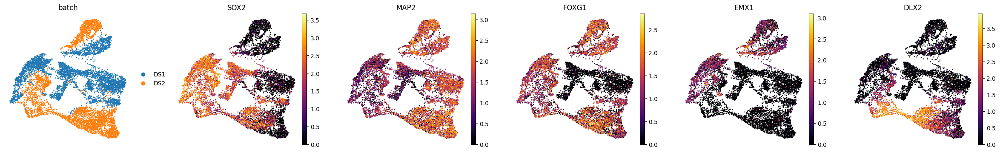

In [132]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_pca', color=['batch','SOX2','MAP2','FOXG1','EMX1','DLX2'], cmap='inferno', ncols=6, frameon=False)

### Harmony

[Harmony](https://www.nature.com/articles/s41592-019-0619-0), developed by Soumya Raychaudhurils lab, is one of  the most highlighted integration method many benchmarkings on scRNA-seq batch effect correction tools. In brief, Harmony uses fuzzy clustering to assign every cell to multiple clusters. For each cluster, it then calculates a correction factor for each data set to move the centroid of the cluster of this data set towards the global centroid of the cluster. Since every cell is represented as a combination of multiple clusters, a cell-specific correction factor is calculated by averaging the correction factors of clusters that the cell belongs to while weighting by the cluster assignment ratio. This process will be iterated until convergence happens or reaching the iteration limits.

The original harmony implementation was in R (the `harmony` package). Now it has its Python implementation as the `harmonypy` package, and `Scanpy` provides the wrapper function `sc.external.pp.harmony_integrate`.

In [146]:
sc.external.pp.harmony_integrate(adata=adata,
                                 key='batch',
                                 basis='X_pca',
                                 adjusted_basis='X_harmony',
                                 max_iter_harmony=50)
sc.pp.neighbors(adata, use_rep='X_harmony', key_added='harmony')
sc.tl.umap(adata, neighbors_key='harmony')
adata.obsm['X_umap_harmony'] = adata.obsm['X_umap'].copy()

2025-02-27 22:05:49,245 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-27 22:05:49,945 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-27 22:05:49,981 - harmonypy - INFO - Iteration 1 of 50
2025-02-27 22:05:51,281 - harmonypy - INFO - Iteration 2 of 50
2025-02-27 22:05:52,376 - harmonypy - INFO - Iteration 3 of 50
2025-02-27 22:05:53,469 - harmonypy - INFO - Iteration 4 of 50
2025-02-27 22:05:54,562 - harmonypy - INFO - Iteration 5 of 50
2025-02-27 22:05:55,656 - harmonypy - INFO - Iteration 6 of 50
2025-02-27 22:05:56,762 - harmonypy - INFO - Iteration 7 of 50
2025-02-27 22:05:57,871 - harmonypy - INFO - Converged after 7 iterations


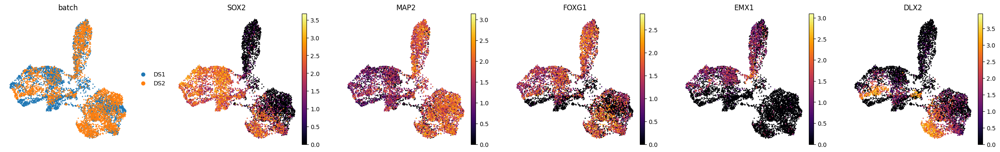

In [147]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_harmony', color=['batch','SOX2','MAP2','FOXG1','EMX1','DLX2'], cmap='inferno', ncols=6, frameon=False)

### MNN

[MNN](https://www.nature.com/articles/nbt.4091), developed by John Marioni's lab in EMBL-EBI (now in Genentech), is one of the first algorithms developed for scRNA-seq data integration or batch correction. It estimates a cell-specific correction vector based on the mutual nearest neighbors between cells from two different samples/batches to introduce correction to the dimension reduction (e.g. PCA) of the query cells. It also introduces an ordering mechanism so that it also supports integration of more than two samples/batches. Although not being the most highlighted methods in the benchmarking paper mentioned above, it is one of the best methods according to other benchmark effort (e.g. Luecken et al.).

MNN was originally developed in R. The Python implemented is provided by the `mnnpy` package, and can be called via `Scanpy` with the wrapper function `sc.external.pp.mnn_correct`. Since the function expects a list of anndata, each of which represents one sample, we need to split the data into a list of anndata, and then provide the list as the input.

In [138]:
adatas = [ adata[adata.obs['batch']==x,:].copy() for x in adata.obs['batch'].cat.categories ]

In [ ]:
adata_mnn = sc.external.pp.mnn_correct(*(x for x in adatas),
                                       var_subset=adata.var_names[adata.var['highly_variable']],
                                       svd_dim = 20,
                                       batch_key='batch',
                                       batch_categories=adata.obs['batch'].cat.categories,
                                       do_concatenate=True,
                                       n_jobs=5)

**IMPORTANT** The `mnnpy` package is currently out of maintenance, and will very likely run into issues, for example, outputing error message of `TypeError: Unexpected keyword argument {'n_jobs':...}`. This is a [reported issue](https://github.com/chriscainx/mnnpy/issues/53). So far there is no official fix, and the workaround solution needs manual modification of the mnnpy script. If you really keen to try it, please follow the description in the reported issue.

### Scanorama

[Scanorama](https://www.nature.com/articles/s41587-019-0113-3) is another popular integration method, developed by Bonnie Berger's lab. Similar to MNN, it identifies mutual nearest neighbor matches between datasets, based on the global low-dimensional cell embedding. When the MNN matches are found, it calculates translation vectors for each cell, and stitch data sets together in the order based on the basis of the percentages of cells in the datasets that were involved in a match. This makes it much more scalable and can handle large data sets.

Scanorama was developed and implemented in Python as the `scanorama` package. `Scanpy` provides the wrapper function as `sc.external.pp.scanorama_integrate`.

In [154]:
sc.external.pp.scanorama_integrate(adata=adata,
                                   key='batch',
                                   basis='X_pca',
                                   adjusted_basis='X_scanorama',
                                   knn=20)
sc.pp.neighbors(adata, use_rep='X_scanorama', key_added='scanorama')
sc.tl.umap(adata, neighbors_key='scanorama')
adata.obsm['X_umap_scanorama'] = adata.obsm['X_umap'].copy()

[[0.           0.6205633803]
 [0.           0.          ]]
Processing datasets DS1 <=> DS2


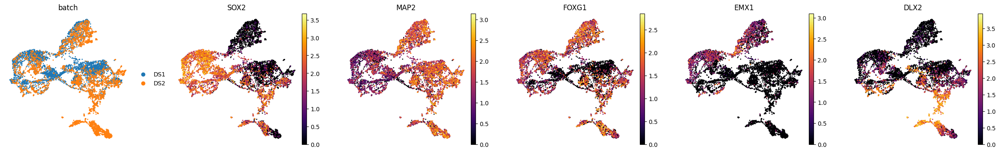

In [155]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_scanorama', color=['batch','SOX2','MAP2','FOXG1','EMX1','DLX2'], cmap='inferno', ncols=6, frameon=False)

### BBKNN

All the previous integration methods, as well as many others, act on the cell embeddings by either manipulating an existed cell embedding or generating a brand new one. [BBKNN](https://academic.oup.com/bioinformatics/article/36/3/964/5545955), which was developed by Sarah Teichmann lab, works differently. It is also considered as one of the most efficient and best-performing batch correction method for scRNA-seq data. Instead of generating a new cell embedding, it tries to generate a k-nearest neighbor graph, in which the numbers of neighborhood coming from different samples or batches are balanced for each cell. The kNN graph generated by BBKNN can then be used directly for UMAP reconstruction and clustering, to replace the default `sc.pp.neighbors` function in `Scanpy`.

BBKNN was originally developed and implemented in Python as the `bbknn` package. `Scanpy` provides the wrapper function as `sc.external.pp.bbknn`.

***P.S.*** Parameter that might matter: `n_pcs` determines how many of the first dimensions of the cell embedding to be used. `neighbors_within_batch` determines how many top neighbours to report for each batch as the initial neighborhood graph reconstruction. `trim` determines the edge triming behavior from the initial neighborhood graph.

In [152]:
sc.external.pp.bbknn(adata, batch_key='batch', use_rep='X_pca', n_pcs=20, neighbors_within_batch=5)
sc.tl.umap(adata)
adata.obsm['X_umap_bbknn'] = adata.obsm['X_umap'].copy()

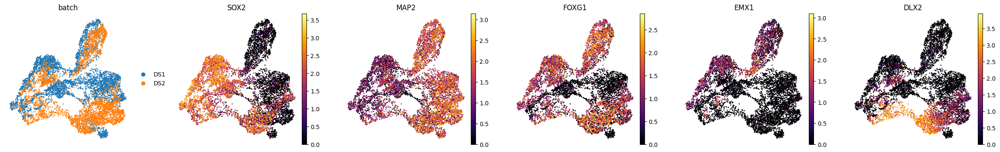

In [153]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_bbknn', color=['batch','SOX2','MAP2','FOXG1','EMX1','DLX2'], cmap='inferno', ncols=6, frameon=False)

### Reference similarity spectrum (RSS) and cluster similarity spectrum (CSS)

In the original publication of the example data set, we used a data representation we developed which is called [reference similarity spectrum (RSS)](https://www.nature.com/articles/s41586-019-1654-9), to integrate different samples. The principle of this approach is as followed. Assume there is a reference data set with multiple sample, where differences among those samples contain information of the cell type heterogeneity in the samples, representing each cell by its transcriptome similarities to those reference samples rather than its transcriptome profile itself may efficiently clean up technical noise while preserving the essential information.

The RSS representation requires external reference samples, which is not always available. To address this limitation, we extended the method and developed [cluster similarity spectrum (CSS)](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-020-02147-4). Instead of using external reference data set to represent cells in the data by similarities, it firstly does cell clustering to scRNA-seq data of each sample to be integrated, and uses the average expression profiles of the resulted clusters as the reference to calculate these similarities.

Both methods were originally implemented in R. To facilitate the growing need of analyzing scRNA-seq data in Python, we are now providing also the Python implementation. It is yet to be packed into a Python package, but the relevant functions have been implemented and provided in this tutorial repository under the `ext` folder. It can be imported directly as a module.

In [105]:
import ext.simspec as simspec

In [128]:
ref = pd.read_csv('data/ext/brainspan_fetal.tsv.gz', sep='\t', index_col=0, header=0).transpose()
simspec.ref_sim_spectrum(adata=adata, ref=ref)
sc.pp.neighbors(adata, use_rep='X_rss', key_added='rss')
sc.tl.umap(adata, neighbors_key='rss')
adata.obsm['X_umap_rss'] = adata.obsm['X_umap'].copy()

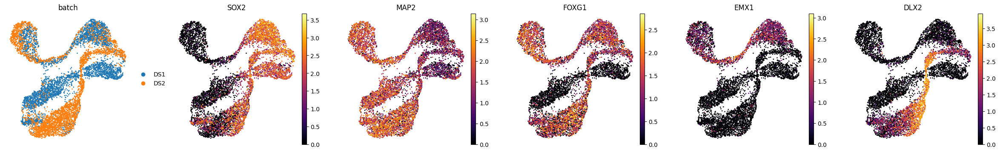

In [130]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_rss', color=['batch','SOX2','MAP2','FOXG1','EMX1','DLX2'], cmap='inferno', ncols=6, frameon=False)

In [129]:
simspec.cluster_sim_spectrum(adata=adata, batch='batch', method_corr='spearman', resolution_clustering=1)
sc.pp.neighbors(adata, use_rep='X_css', key_added='css')
sc.tl.umap(adata, neighbors_key='css')
adata.obsm['X_umap_css'] = adata.obsm['X_umap'].copy()

Splitting samples...
Clustering each sample...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  4.16it/s]


Estimate average transcriptomic profiles for clusters...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 39.03it/s]


Calculate similarities...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.10s/it]


Generate final embedding...


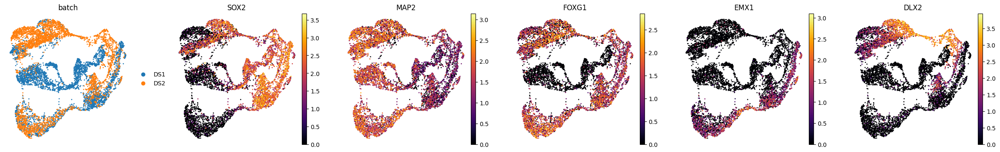

In [131]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_css', color=['batch','SOX2','MAP2','FOXG1','EMX1','DLX2'], cmap='inferno', ncols=6, frameon=False)

### How to decide which integration result to use?

Well, this is indeed very difficult and usually there is no obvious answer. When there are existing cell type annotation for each of the batch/sample which are also comparable across batches/samples, there are benchmarking tools such as [scIB](https://www.nature.com/articles/s41592-021-01336-8) which can calculate different metrics to evaluate how well different tools in intermixing cells from different batches, while at the same time keeping only the consistent cell types together. In most of the time, this is unfortunately not the case. One can of course analyze each batch separately, annotate them separately, and then use these labels for benchmarking. However, this can be very time consumping especially if there are many samples or batches. Also, when different samples contain different cell types with some similar molecular features, characterzing each sample separately may result in mis-annotation.

Another way to get preliminary labels for each sample is through automatic cell type annotation tools. For example, both [Garnett](https://cole-trapnell-lab.github.io/garnett/) developed by Cole Trapnell's lab, and [Capybara](https://github.com/morris-lab/Capybara) developed by Samantha Morris' lab use similar strategy, to firstly standarize cell type annotations of existing scRNA-seq data, train one or multiple prediction model using the annotated data, and then apply the models to a new data set for the automated annotation. Both methods are unfortunately only available in R. [Snapseed](https://github.com/devsystemslab/snapseed) is a light-weighted Python package we developed to annotate single-cell datasets based on manually defined sets of marker genes for individual cell types or cell type hierarchies, and has been used in our [integrated transcriptomic cell atlas of human neural organoids](https://www.nature.com/articles/s41586-024-08172-8). [CellAnnotator](https://github.com/quadbio/cell-annotator) uses the ChatGPT LLM via its API to automatically annotate cell clusters for each sample based on their marker genes.

In practice, though, we would make a decision in a quite subjective manner in most of the time. For each of the integration result, you may simply ask yourself several questions, for example,
1. Do you see cells expressing similar canonical markers but from different batches/samples always separated?
2. Do you see cells from different samples and expressing different markers being mixed together after the integration?
3. Do you see any continuous trajectory, which you can see in a single batch/sample or the unintegrated UMAP, but being lost after the integration?

If you give a clear yes to one of these questions, you may want to reconsider whether this is actually a good integration result.

## Clustering and pseudotime analysis based on the integrated data

Once an integration result is chosen, we can move on to do clustering and other analysis which are based on a given cell embedding. With the example data set, let's continue with the RSS integration result for now.

In [176]:
sc.tl.leiden(adata, neighbors_key='rss', resolution=0.5, key_added='leiden_res_0.5')
sc.tl.leiden(adata, neighbors_key='rss', resolution=1, key_added='leiden_res_1')

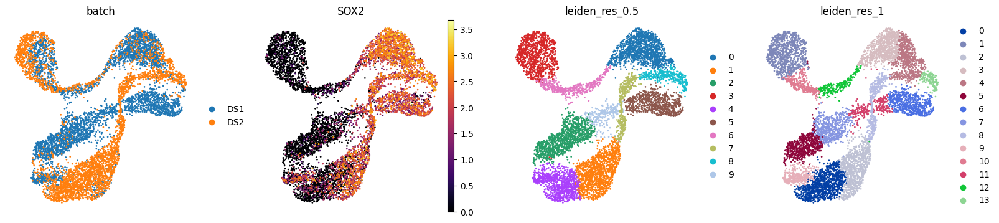

In [184]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_rss',
                    color=['batch','SOX2','leiden_res_0.5','leiden_res_1'],
                    cmap='inferno', ncols=4, frameon=False)

In [178]:
sc.tl.diffmap(adata, n_comps=20, neighbors_key='rss')

In [180]:
idx_subset = np.where(np.isin(adata.obs['leiden_res_0.5'],
                              ['0','8','5']))[0]
idxs_rand_root = np.apply_along_axis(lambda x: random_root(adata, idx_subset=idx_subset),
                                     1, np.array(range(1000))[:,None])
adata.uns['iroot'] = np.argmax(np.bincount(idxs_rand_root))
adata.obs['is_DPTRoot'] = False
adata.obs.loc[adata.obs_names[adata.uns['iroot']],'is_DPTRoot'] = True

In [181]:
sc.tl.dpt(adata, n_dcs=20)

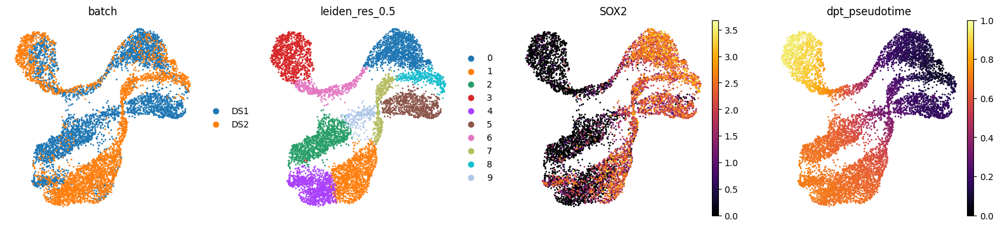

In [185]:
with plt.rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_rss',
                    color=['batch','leiden_res_0.5','SOX2','dpt_pseudotime'],
                    cmap='inferno', ncols=4, frameon=False)

## Save the final anndata

In [186]:
adata.write_h5ad('DS1_DS2_processed.h5ad')

# Part 3: Advanced scRNA-seq analysis with Python

TBA...